# Installs & Setup

In [ ]:
!pip install -q pymc pytensor pymc-extras preliz nutpie threadpoolctl jax jaxlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.0/253.0 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 517.1/517.1 kB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 65.9 MB/s eta 0:00:00


In [ ]:
import sys
sys.path.append("..")

import warnings
warnings.filterwarnings(action="ignore", message="The RandomType SharedVariables")
warnings.filterwarnings(action="ignore", message="No frequency was specific on the data's DateTimeIndex")

import matplotlib.pyplot as plt
from matplotlib.dates import DayLocator, MonthLocator, YearLocator, DateFormatter

import pymc_extras.statespace as pmss
import pymc as pm

import preliz as pz
import pandas as pd
import arviz as az
import numpy as np
import seaborn as sns
from scipy import stats
from scipy.special import inv_boxcox
import os

import ipywidgets as widgets
from IPython.display import display
from functools import partial
import pytensor
import pytensor.tensor as pt
from pymc_extras.statespace.filters.distributions import LinearGaussianStateSpace
from pymc.model.transform.optimization import freeze_dims_and_data
from pymc_extras.statespace import structural as st

In [ ]:
plt.rcParams.update(
    {
        "figure.figsize": (14, 4),
        "figure.dpi": 144,
        "figure.facecolor": "w",
        "axes.grid": True,
        "grid.linewidth": 0.5,
        "grid.linestyle": "--",
        "axes.spines.top": False,
        "axes.spines.bottom": False,
        "axes.spines.left": False,
        "axes.spines.right": False,
        "figure.constrained_layout.use": True,
    }
)

In [ ]:
def sampler_kwargs():
    return dict(
        nuts_sampler="nutpie",
        chains=4,
        draws=500,
        nuts_sampler_kwargs={"backend": "jax", "gradient_backend": "jax"},
    )

# Data Loading

,Passengers
time,
1949-01-01,112.0
1949-02-01,118.0
1949-03-01,132.0
1949-04-01,129.0
1949-05-01,121.0


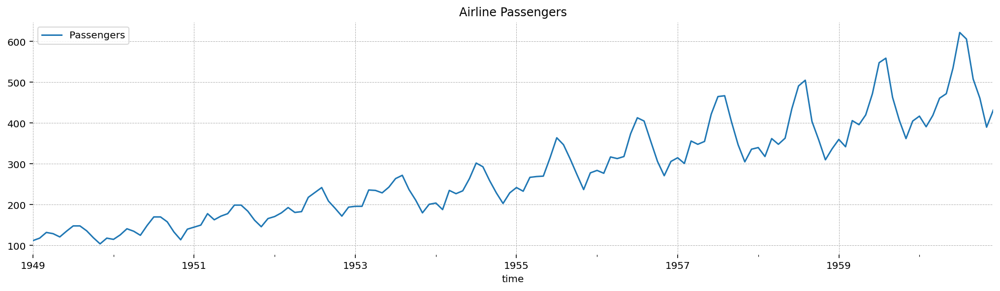

In [ ]:
# Load Airline Passengers dataset
url = 'https://raw.githubusercontent.com/jbrownlee/Datasets/master/airline-passengers.csv'

# Load the dataset
df = pd.read_csv(url)
df = df.rename(columns={"Month": "time"}) \
    .set_index("time") \
    .astype(float)

# Ensure datetime index
df.index = pd.to_datetime(df.index)

# Display
display(df.head())
print("\n")
df.plot(title="Airline Passengers")
plt.show();

# Data Transformation

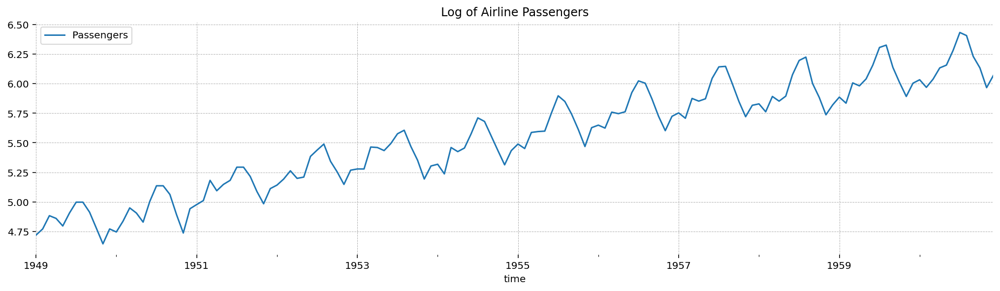

In [ ]:
# Log of the data
df_log = df.map(np.log)

# Ensure datetime index
df_log.index = pd.to_datetime(df_log.index)

# Plot
df_log.plot(title="Log of Airline Passengers")
plt.show();

# ETS

In [ ]:
# ETS model
ets_ss_mod = pmss.BayesianETS(
    endog_names=["Passengers"],
    order=("A", "Ad", "A"),
    seasonal_periods=12,
    stationary_initialization=True,
)
ets_ss_mod.coords
ets_ss_mod.param_dims

{'P0': ('state', 'state_aux'),
 'sigma_state': None,
 'initial_level': None,
 'initial_trend': None,
 'initial_seasonal': ('seasonal_lag',),
 'seasonal_param': ('seasonal_lag',)}

In [ ]:
# Model run
with pm.Model(coords=ets_ss_mod.coords) as ets_mod:
    initial_level = pm.Normal("initial_level", mu=0, sigma=3)
    initial_trend = pm.Normal("initial_trend", mu=0, sigma=1)
    initial_seasonal = pm.ZeroSumNormal("initial_seasonal", sigma=1, dims=["seasonal_lag"])

    alpha = pm.Beta("alpha", alpha=1, beta=1)
    beta = pm.Beta("beta", alpha=1, beta=1)
    gamma = pm.Beta("gamma", alpha=1, beta=1)

    phi_params = pz.maxent(pz.Beta(), lower=0.85, upper=0.98, plot=False).params_dict
    phi = pm.Beta("phi", **phi_params)

    sigma_state = pm.Exponential("sigma_state", lam=1)

    ets_ss_mod.build_statespace_graph(data=df_log, mode="JAX")

    idata_ets = pm.sample(**sampler_kwargs())

Progress,Draws,Divergences,Step Size,Gradients/Draw
,1500,0,0.49,15
,1500,0,0.49,7
,1500,0,0.47,15
,1500,0,0.50,7


In [ ]:
# Inference data
idata_ets_post = ets_ss_mod.sample_conditional_posterior(idata_ets)

# Forecast
idata_ets_forecast = ets_ss_mod.forecast(
    idata_ets,
    start=df.index[-1],
    end=df.index.shift(36)[-1]
)

Output()

Output()

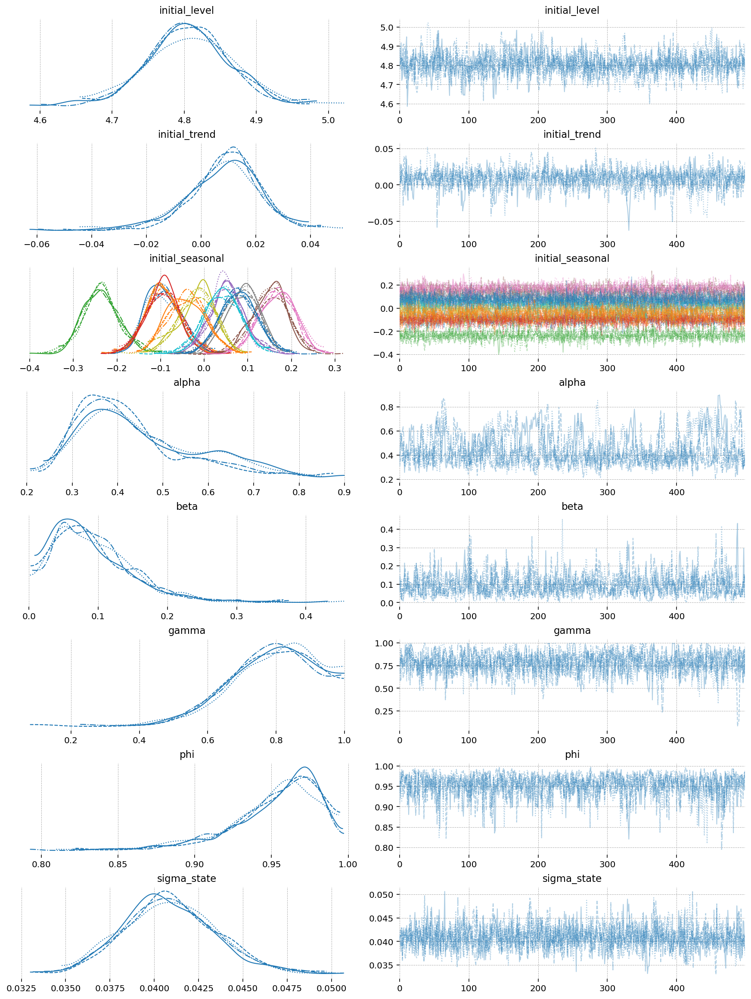

In [ ]:
# Plot trace
az.plot_trace(idata_ets, var_names=[x.name for x in ets_mod.free_RVs]);

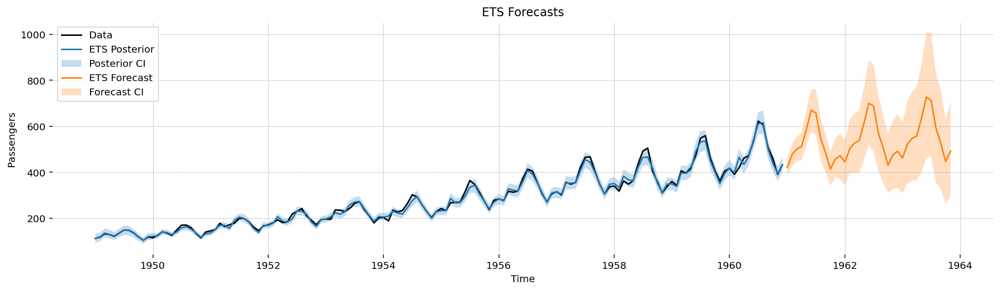

In [ ]:
# Plot forecast
fig, ax = plt.subplots()

idata_ets_post_exp = np.exp(idata_ets_post.predicted_posterior_observed.isel(observed_state=0))
idata_ets_forecast_exp = np.exp(idata_ets_forecast.forecast_observed.isel(observed_state=0))

mu_ets = idata_ets_post_exp.mean(dim=["chain", "draw"])
hdi_ets = az.hdi(idata_ets_post_exp).predicted_posterior_observed

ax.plot(df.index, df.Passengers, c="k")
ax.plot(df.index, mu_ets)
ax.fill_between(df.index, *hdi_ets.values.T, alpha=0.25)

mu_ets_forecast = idata_ets_forecast_exp.mean(dim=["chain", "draw"]).isel(time=slice(1, None))
hdi_ets_forecast = az.hdi(idata_ets_forecast_exp).forecast_observed.isel(time=slice(1, None))
forecast_idx = df.index.shift(35)[-35:]
ax.plot(forecast_idx, mu_ets_forecast)
ax.fill_between(forecast_idx, *hdi_ets_forecast.values.T, alpha=0.25)

ax.legend(["Data", "ETS Posterior", "Posterior CI", "ETS Forecast", "Forecast CI"])
ax.set_ylabel("Passengers")
ax.set_xlabel("Time")
ax.set_title("ETS Forecasts")
plt.show()

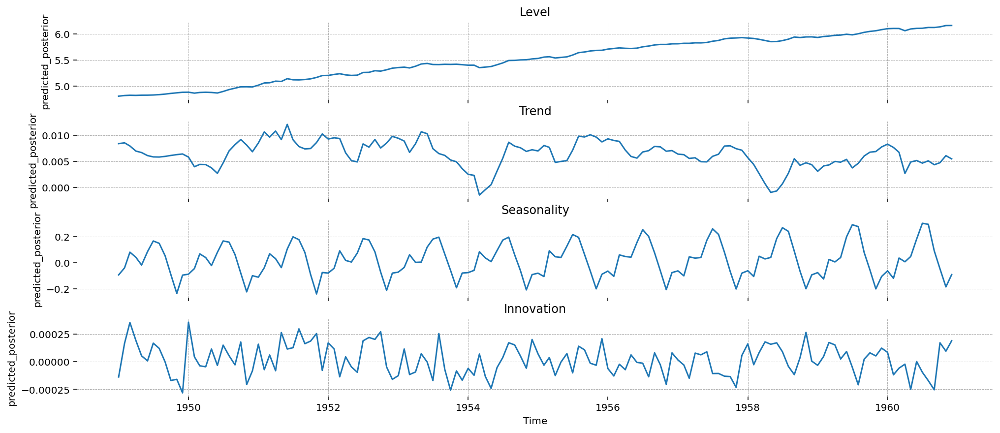

In [ ]:
# Plot decomposition
fig, ax = plt.subplots(4, 1, figsize=(14, 6), sharex=True)
for axis, state in zip(fig.axes, ["level", "trend", "seasonality", "innovation"]):
    (
        idata_ets_post.predicted_posterior.sel(state=state) \
        .mean(dim=["chain", "draw"]) \
        .plot.line(x="time", ax=axis)
    )
    axis.set(title=state.title(), xlabel="" if state != "innovation" else "Time")

# SARIMA

In [ ]:
def sample_kwargs():
    return {
        "nuts_sampler": "nutpie",
        "cores": 4,
        "draws": 500,
        "tune": 2000,
        "nuts_sampler_kwargs": {"backend": "jax", "gradient_backend": "jax"},
    }

In [ ]:
# SARIMA model
sarima_ss_mod = pmss.BayesianSARIMA(
    order=(2, 1, 2),
    seasonal_order=(2, 0, 2, 12),
    verbose=True,
    stationary_initialization=False
)
sarima_ss_mod.coords
sarima_ss_mod.param_dims

{'x0': ('state',),
 'P0': ('state', 'state_aux'),
 'sigma_state': None,
 'ar_params': ('ar_lag',),
 'ma_params': ('ma_lag',),
 'seasonal_ar_params': ('seasonal_ar_lag',),
 'seasonal_ma_params': ('seasonal_ma_lag',)}

In [ ]:
# Model run
with pm.Model(coords=sarima_ss_mod.coords) as arma_model:
    intercept = pm.Normal("intercept", mu=4.5, sigma=1, shape=(1,))
    x0 = pm.Deterministic(
        "x0", pt.concatenate([intercept, pt.zeros(sarima_ss_mod.k_states - 1)]), dims=["state"]
    )

    sigma_P0 = pm.Gamma("sigma_P0", alpha=2, beta=10, shape=(2,))
    P0 = pt.eye(sarima_ss_mod.k_states) * sigma_P0[1]
    P0 = pt.set_subtensor(P0[0, 0], sigma_P0[0])
    P0 = pm.Deterministic("P0", P0, dims=["state", "state_aux"])

    ar_params = pm.Normal("ar_params", mu=0.0, sigma=0.5, dims=sarima_ss_mod.param_dims["ar_params"])
    seasonal_ar_params = pm.Normal(
        "seasonal_ar_params", mu=0.0, sigma=0.5, dims=sarima_ss_mod.param_dims["seasonal_ar_params"]
    )

    ma_params = pm.Normal("ma_params", mu=0.0, sigma=0.5, dims=sarima_ss_mod.param_dims["ma_params"])
    seasonal_ma_params = pm.Normal(
        "seasonal_ma_params", mu=0.0, sigma=0.5, dims=sarima_ss_mod.param_dims["seasonal_ma_params"]
    )

    state_sigmas = pm.Gamma("sigma_state", alpha=2, beta=1.0, dims=sarima_ss_mod.param_dims["sigma_state"])

    sarima_ss_mod.build_statespace_graph(data=df_log, mode="JAX")

    idata_sarima = pm.sample(**sample_kwargs())

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2500,0,0.33,15
,2500,0,0.35,23
,2500,0,0.34,23
,2500,0,0.35,31


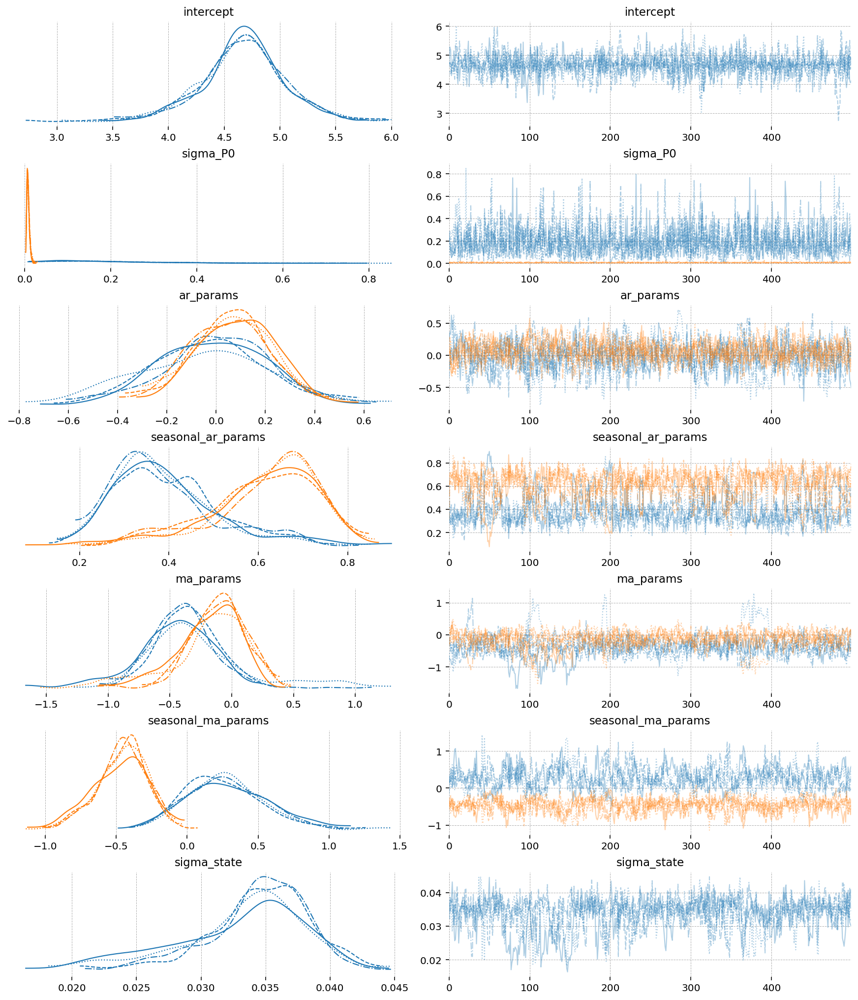

In [ ]:
# Plot trace
az.plot_trace(idata_sarima, var_names=[rv.name for rv in arma_model.basic_RVs[:-1]]);

In [ ]:
# Inference data
idata_sarima_post = sarima_ss_mod.sample_conditional_posterior(idata_sarima)

# Forecast
idata_sarima_forecast = sarima_ss_mod.forecast(
    idata_sarima,
    start=df.index[-1],
    end=df.index.shift(36)[-1]
)

Output()

Output()

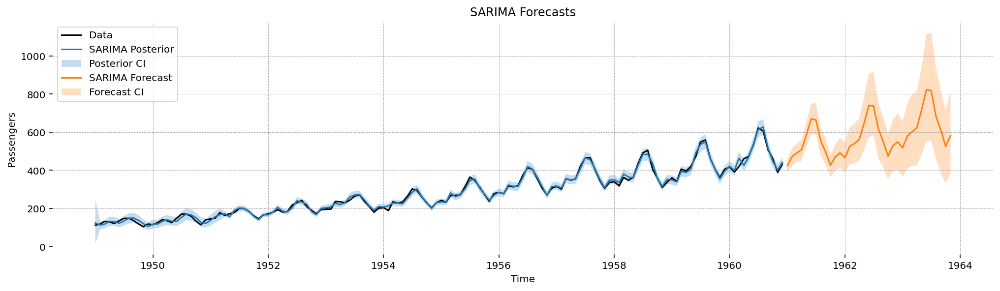

In [ ]:
# Plot forecast
fig, ax = plt.subplots()

idata_sarima_post_exp = np.exp(idata_sarima_post.predicted_posterior_observed.isel(observed_state=0))
idata_sarima_forecast_exp = np.exp(idata_sarima_forecast.forecast_observed.isel(observed_state=0))

mu_sarima = idata_sarima_post_exp.mean(dim=["chain", "draw"])
hdi_sarima = az.hdi(idata_sarima_post_exp).predicted_posterior_observed

ax.plot(df.index, df.Passengers, c="k")
ax.plot(df.index, mu_sarima)
ax.fill_between(df.index, *hdi_sarima.values.T, alpha=0.25)

mu_sarima_forecast = idata_sarima_forecast_exp.mean(dim=["chain", "draw"]).isel(time=slice(1, None))
hdi_sarima_forecast = az.hdi(idata_sarima_forecast_exp).forecast_observed.isel(time=slice(1, None))
forecast_idx = df.index.shift(35)[-35:]
ax.plot(forecast_idx, mu_sarima_forecast)
ax.fill_between(forecast_idx, *hdi_sarima_forecast.values.T, alpha=0.25)

ax.legend(["Data", "SARIMA Posterior", "Posterior CI", "SARIMA Forecast", "Forecast CI"])
ax.set_ylabel("Passengers")
ax.set_xlabel("Time")
ax.set_title("SARIMA Forecasts")
plt.show()

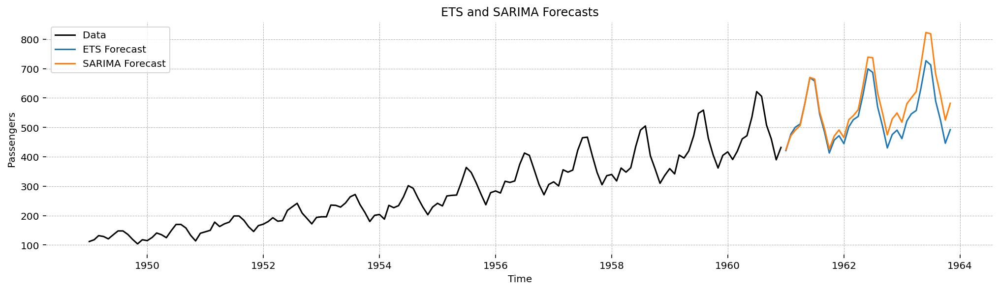

In [ ]:
# Plot both forecasts
fig, ax = plt.subplots()

ax.plot(df.index, df.Passengers, c="k")

forecast_idx = df.index.shift(35)[-35:]
ax.plot(forecast_idx, mu_ets_forecast)
ax.plot(forecast_idx, mu_sarima_forecast)

ax.legend(["Data", "ETS Forecast", "SARIMA Forecast"])
ax.set_ylabel("Passengers")
ax.set_xlabel("Time")
ax.set_title("ETS and SARIMA Forecasts")
plt.show()

# Structural

In [ ]:
def sampler_kwargs():
    return dict(
        nuts_sampler="nutpie",
        chains=4,
        draws=500,
        nuts_sampler_kwargs={"backend": "jax", "gradient_backend": "jax"},
    )

In [ ]:
# Structural model
ll = st.LevelTrendComponent(order=2)
se = st.FrequencySeasonality(season_length=12, name="monthly")

full_mod = ll + se
struct_ss_mod = full_mod.build()
struct_ss_mod.coords
struct_ss_mod.param_dims

{'initial_trend': ('trend_state',),
 'sigma_trend': ('trend_shock',),
 'monthly': ('monthly_state',),
 'P0': ('state', 'state_aux')}

In [ ]:
# Extract param_dims values
initial_trend_dims, sigma_trend_dims, monthly_dims, P0_dims = struct_ss_mod.param_dims.values()
coords = struct_ss_mod.coords

In [ ]:
# Model run
with pm.Model(coords=coords) as struct_mod:
    P0_diag = pm.Gamma("P0_diag", alpha=2, beta=1, dims=P0_dims[0])
    P0 = pm.Deterministic("P0", pt.diag(P0_diag), dims=P0_dims)
    initial_trend = pm.Normal("initial_trend", sigma=[100, 1], dims=initial_trend_dims)
    monthly_seasonal = pm.ZeroSumNormal("monthly", sigma=100, dims=monthly_dims)

    sigma_trend = pm.Gamma("sigma_trend", alpha=2, beta=[1, 10], dims=sigma_trend_dims)
    sigma_monthly_seasonal = pm.Gamma("sigma_monthly", alpha=2, beta=1)

    struct_ss_mod.build_statespace_graph(df, mode="JAX")
    idata_struct = pm.sample(**sampler_kwargs())

Progress,Draws,Divergences,Step Size,Gradients/Draw
,1500,0,0.56,7
,1500,0,0.54,7
,1500,0,0.55,7
,1500,0,0.56,7


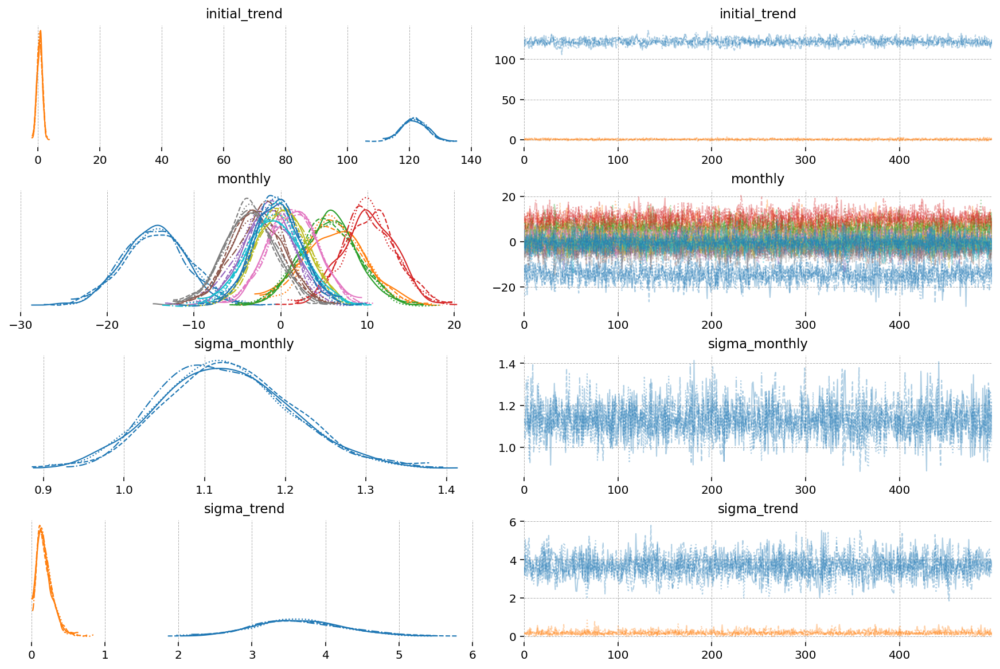

In [ ]:
# Plot trace
az.plot_trace(idata_struct, var_names=["~P0", "~__"], filter_vars="like");

In [ ]:
# Inference data
idata_struct_post = struct_ss_mod.sample_conditional_posterior(idata_struct)

# Forecast
idata_struct_forecast = struct_ss_mod.forecast(
    idata_struct,
    start=df.index[-1],
    end=df.index.shift(36)[-1]
)

Output()

Output()

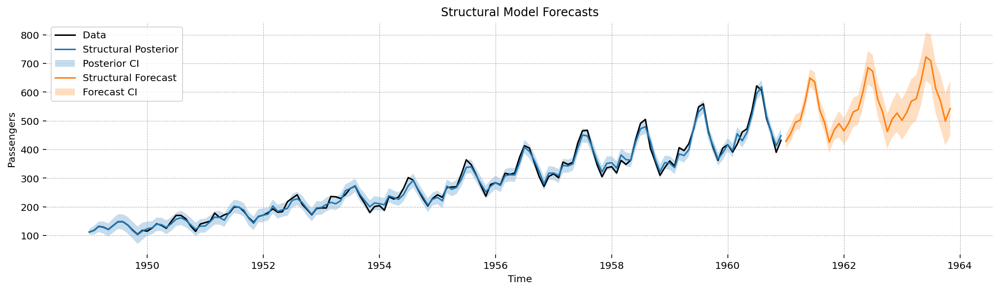

In [ ]:
# Plot forecast
fig, ax = plt.subplots()

idata_struct_post_2 = idata_struct_post.predicted_posterior_observed.isel(observed_state=0)
idata_struct_forecast_2 = idata_struct_forecast.forecast_observed.isel(observed_state=0)

mu_struct = idata_struct_post_2.mean(dim=["chain", "draw"])
hdi_struct = az.hdi(idata_struct_post_2).predicted_posterior_observed

ax.plot(df.index, df.Passengers, c="k")
ax.plot(df.index, mu_struct)
ax.fill_between(df.index, *hdi_struct.values.T, alpha=0.25)

mu_struct_forecast = idata_struct_forecast_2.mean(dim=["chain", "draw"]).isel(time=slice(1, None))
hdi_struct_forecast = az.hdi(idata_struct_forecast_2).forecast_observed.isel(time=slice(1, None))
forecast_idx = df.index.shift(35)[-35:]
ax.plot(forecast_idx, mu_struct_forecast)
ax.fill_between(forecast_idx, *hdi_struct_forecast.values.T, alpha=0.25)

ax.legend(["Data", "Structural Posterior", "Posterior CI", "Structural Forecast", "Forecast CI"])
ax.set_ylabel("Passengers")
ax.set_xlabel("Time")
ax.set_title("Structural Model Forecasts")
plt.show()

In [ ]:
# Extract components
component_idata = struct_ss_mod.extract_components_from_idata(idata_struct_post)
component_states = component_idata.coords["state"].values.tolist()

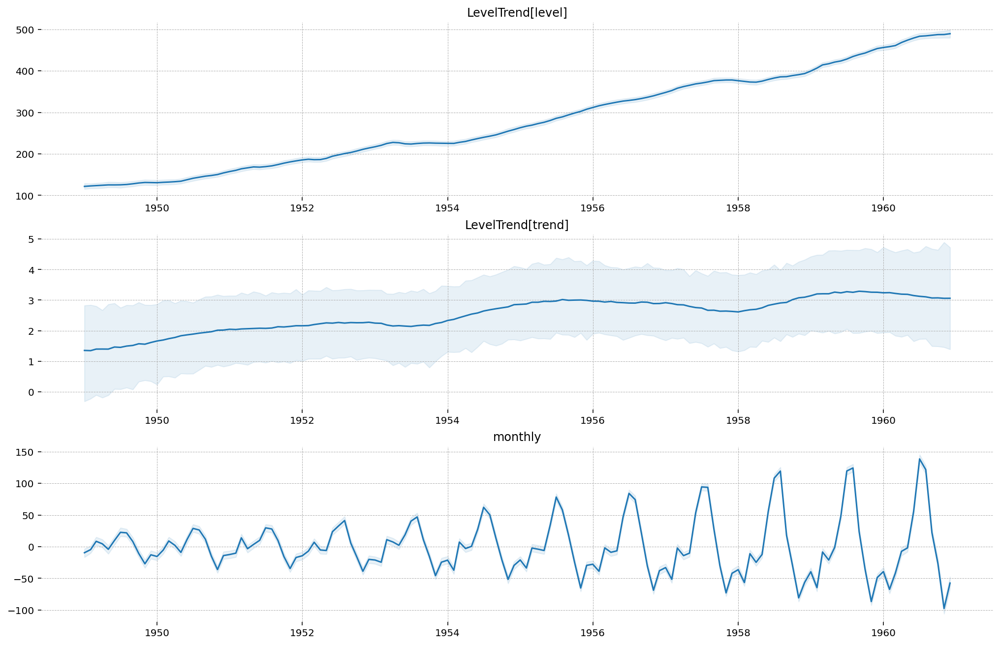

In [ ]:
# Plot decomposition
fig, ax = plt.subplots(3, 1, figsize=(14, 9))
x_values = component_idata.coords["time"]
for axis, name in zip(fig.axes, component_states):
    data = component_idata.smoothed_posterior.sel(state=name)
    hdi = az.hdi(data).smoothed_posterior
    mean = data.mean(dim=["chain", "draw"])

    axis.plot(x_values, mean)
    axis.fill_between(x_values, *hdi.values.T, color="tab:blue", alpha=0.1)
    axis.set_title(name)
plt.show()

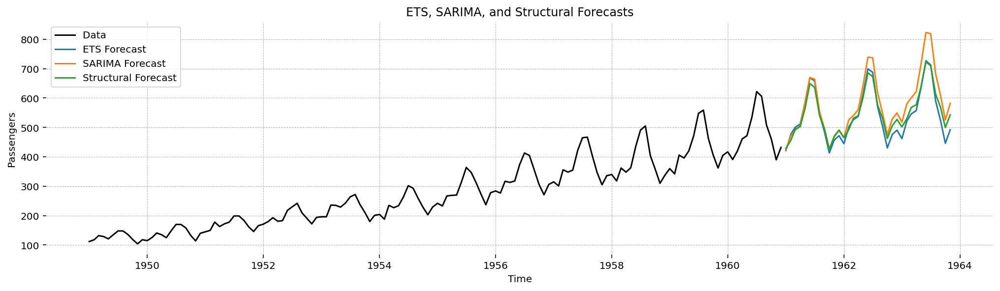

In [ ]:
# Plot all forecasts
fig, ax = plt.subplots()

ax.plot(df.index, df.Passengers, c="k")

forecast_idx = df.index.shift(35)[-35:]
ax.plot(forecast_idx, mu_ets_forecast)
ax.plot(forecast_idx, mu_sarima_forecast)
ax.plot(forecast_idx, mu_struct_forecast)

ax.legend(["Data", "ETS Forecast", "SARIMA Forecast", "Structural Forecast"])
ax.set_ylabel("Passengers")
ax.set_xlabel("Time")
ax.set_title("ETS, SARIMA, and Structural Forecasts")
plt.show()

# TBATS

We will implement a TBATS-like model. We will do the Box-Cox transformation outside of the model and leverage the structural components to define the rest of the model. A MovingAverageComponent is not yet supported, so this aspect of TBATS will be left out.

In [ ]:
# Extract the passenger numbers as a 1-D array
passengers = df['Passengers']

# Apply Box-Cox transformation
# stats.boxcox returns the transformed data and the lambda used
df_boxcox_transformed, fitted_lambda = stats.boxcox(passengers)

In [ ]:
# Create a new DataFrame for the transformed data
df_boxcox = pd.DataFrame(df_boxcox_transformed, index=df.index, columns=['Passengers_BoxCox'])

# Ensure datetime index
df_boxcox.index = pd.to_datetime(df_boxcox.index)

# Display the the transformed data
display(df_boxcox.head())
print(f"\nLength of original data: {len(df)}")
print(f"Length of df_boxcox: {len(df_boxcox)}")
print(f"Optimal lambda for Box-Cox Transformation: {fitted_lambda:.4f}")

,Passengers_BoxCox
time,
1949-01-01,6.827489
1949-02-01,6.932821
1949-03-01,7.161890
1949-04-01,7.114609
1949-05-01,6.983785



Length of original data: 144
Length of df_boxcox: 144
Optimal lambda for Box-Cox Transformation: 0.1480


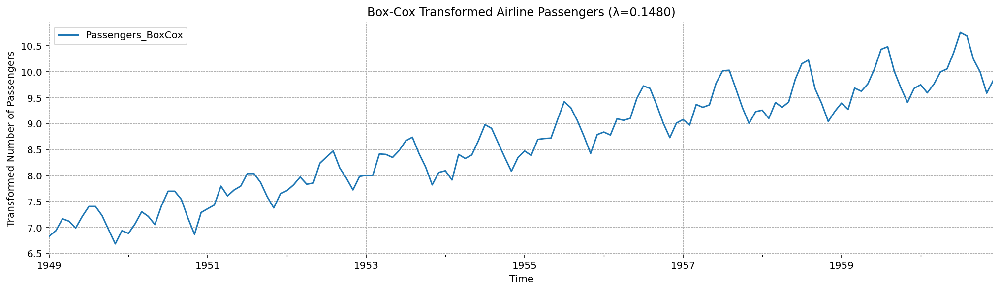

In [ ]:
# Plot the Box-Cox transformed data
df_boxcox.plot(title=f"Box-Cox Transformed Airline Passengers (λ={fitted_lambda:.4f})")
plt.xlabel("Time")
plt.ylabel("Transformed Number of Passengers")
plt.show()

In [ ]:
# TBATS-like model
ll = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
se1 = st.FrequencySeasonality(season_length=12, name="monthly")
se2 = st.FrequencySeasonality(season_length=3, name="quarterly")
ar = st.AutoregressiveComponent(order=2)
me = st.MeasurementError(name="obs")

full_mod_tbats = ll + se1 + se2 + ar + me
tbats_ss_mod = full_mod_tbats.build()
tbats_ss_mod.coords
tbats_ss_mod.param_dims

{'initial_trend': ('trend_state',),
 'sigma_trend': ('trend_shock',),
 'monthly': ('monthly_state',),
 'quarterly': ('quarterly_state',),
 'ar_params': ('ar_lag',),
 'P0': ('state', 'state_aux')}

In [ ]:
# Extract param_dims values
initial_trend_dims, sigma_trend_dims, monthly_dims, quarterly_dims, ar_params_dims, P0_dims = tbats_ss_mod.param_dims.values()
coords = tbats_ss_mod.coords

In [ ]:
# Model run
with pm.Model(coords=coords) as tbats_mod:
    P0_diag = pm.Gamma("P0_diag", alpha=2, beta=1, dims=P0_dims[0])
    P0 = pm.Deterministic("P0", pt.diag(P0_diag), dims=P0_dims)
    initial_trend = pm.Normal("initial_trend", mu=0.0, sigma=10.0, dims=initial_trend_dims)
    monthly_seasonal = pm.ZeroSumNormal("monthly", sigma=100, dims=monthly_dims)
    quarterly_seasonal = pm.ZeroSumNormal("quarterly", sigma=100, dims=quarterly_dims)
    ar_params = pm.Normal("ar_params", mu=0.0, sigma=0.5, dims=ar_params_dims)

    sigma_trend = pm.Gamma("sigma_trend", alpha=2, beta=10, dims=sigma_trend_dims)
    sigma_monthly_seasonal = pm.Gamma("sigma_monthly", alpha=2, beta=1)
    sigma_quarterly_seasonal = pm.Gamma("sigma_quarterly", alpha=2, beta=1)
    sigma_ar = pm.Gamma("sigma_ar", alpha=2, beta=5)
    sigma_obs = pm.HalfNormal("sigma_obs", sigma=1.0)

    tbats_ss_mod.build_statespace_graph(df_boxcox, mode="JAX")
    idata_tbats = pm.sample(**sampler_kwargs())

Progress,Draws,Divergences,Step Size,Gradients/Draw
,1500,47,0.14,31
,1500,4,0.12,31
,1500,0,0.10,31
,1500,2,0.15,31


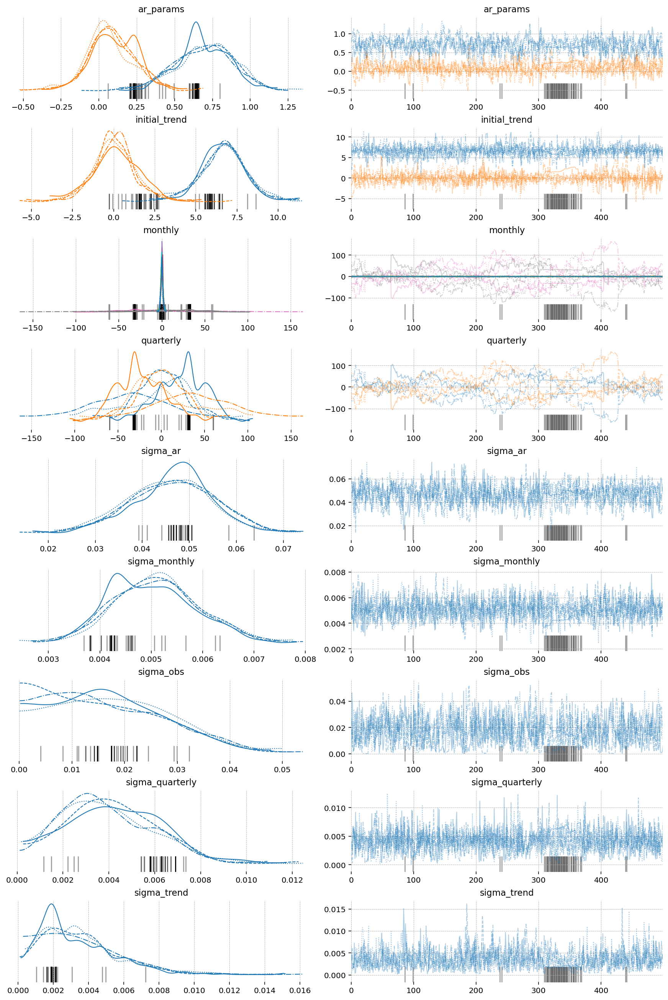

In [ ]:
# Plot trace
az.plot_trace(idata_tbats, var_names=["~P0", "~__"], filter_vars="like");

In [ ]:
# Inference data
idata_tbats_post = tbats_ss_mod.sample_conditional_posterior(idata_tbats)

# Forecast
idata_tbats_forecast = tbats_ss_mod.forecast(
    idata_tbats,
    start=df.index[-1],
    end=df.index.shift(36)[-1]
)

Output()

Output()

Original Data Points: 144
Inverse Transformed Points: 144




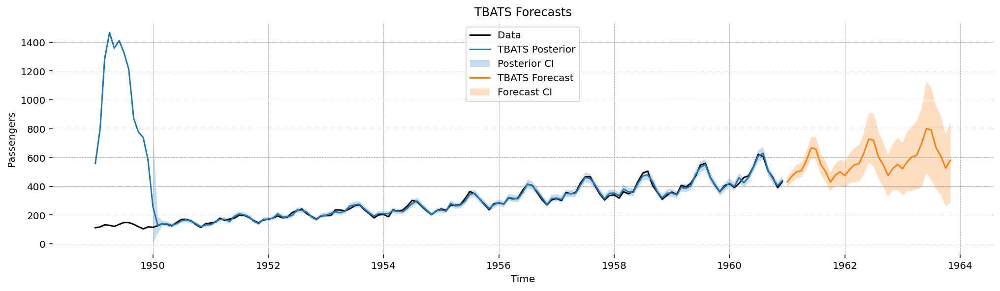

In [ ]:
# Plot forecast
fig, ax = plt.subplots()

idata_tbats_post_inv = inv_boxcox(idata_tbats_post.predicted_posterior_observed.isel(observed_state=0), fitted_lambda)
idata_tbats_forecast_inv = inv_boxcox(idata_tbats_forecast.forecast_observed.isel(observed_state=0), fitted_lambda)

mu_tbats = idata_tbats_post_inv.mean(dim=["chain", "draw"])
hdi_tbats = az.hdi(idata_tbats_post_inv).predicted_posterior_observed

print("Original Data Points:", len(df.Passengers))
print("Inverse Transformed Points:", len(mu_tbats))
print("\n")

ax.plot(df.index, df.Passengers, c="k")
ax.plot(df.index, mu_tbats)
ax.fill_between(df.index, *hdi_tbats.values.T, alpha=0.25)

mu_tbats_forecast = idata_tbats_forecast_inv.mean(dim=["chain", "draw"]).isel(time=slice(1, None))
hdi_tbats_forecast = az.hdi(idata_tbats_forecast_inv).forecast_observed.isel(time=slice(1, None))
forecast_idx = df.index.shift(35)[-35:]
ax.plot(forecast_idx, mu_tbats_forecast)
ax.fill_between(forecast_idx, *hdi_tbats_forecast.values.T, alpha=0.25)

ax.legend(["Data", "TBATS Posterior", "Posterior CI", "TBATS Forecast", "Forecast CI"])
ax.set_ylabel("Passengers")
ax.set_xlabel("Time")
ax.set_title("TBATS Forecasts")
plt.show()

In [ ]:
# Extract components
component_idata = tbats_ss_mod.extract_components_from_idata(idata_tbats_post)
component_states = component_idata.coords["state"].values.tolist()

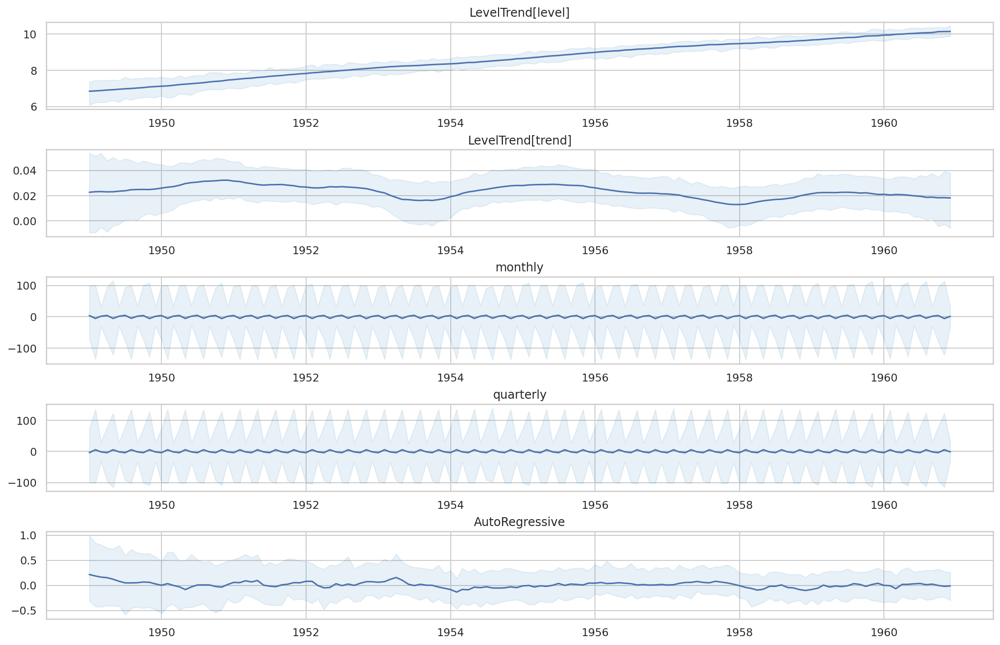

In [65]:
# Plot decomposition
fig, ax = plt.subplots(5, 1, figsize=(14, 9))
x_values = component_idata.coords["time"]
for axis, name in zip(fig.axes, component_states):
    data = component_idata.smoothed_posterior.sel(state=name)
    hdi = az.hdi(data).smoothed_posterior
    mean = data.mean(dim=["chain", "draw"])

    axis.plot(x_values, mean)
    axis.fill_between(x_values, *hdi.values.T, color="tab:blue", alpha=0.1)
    axis.set_title(name)
plt.show()

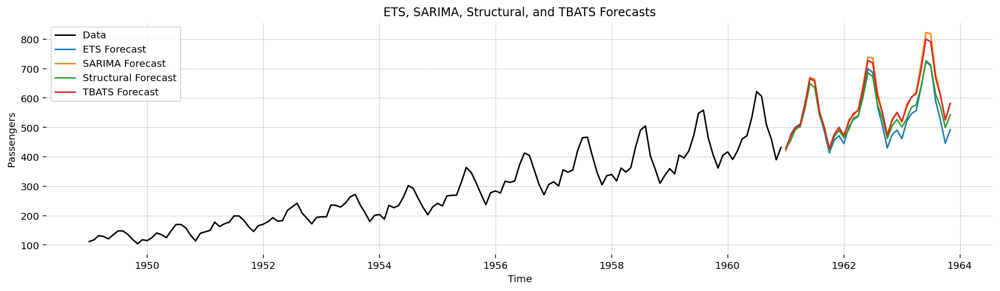

In [ ]:
# Plot all forecasts
fig, ax = plt.subplots()

ax.plot(df.index, df.Passengers, c="k")

forecast_idx = df.index.shift(35)[-35:]
ax.plot(forecast_idx, mu_ets_forecast)
ax.plot(forecast_idx, mu_sarima_forecast)
ax.plot(forecast_idx, mu_struct_forecast)
ax.plot(forecast_idx, mu_tbats_forecast)

ax.legend(["Data", "ETS Forecast", "SARIMA Forecast", "Structural Forecast", "TBATS Forecast"])
ax.set_ylabel("Passengers")
ax.set_xlabel("Time")
ax.set_title("ETS, SARIMA, Structural, and TBATS Forecasts")
plt.show()

# Error Comparison

In [ ]:
# Filter for data from a certain date and onward
start_date = '1950-02-01'
data_filtered = pd.Series(df.Passengers, index=df.index).loc[start_date:]
mu_ets_filtered = pd.Series(mu_ets, index=df.index).loc[start_date:]
mu_sarima_filtered = pd.Series(mu_sarima, index=df.index).loc[start_date:]
mu_struct_filtered = pd.Series(mu_struct, index=df.index).loc[start_date:]
mu_tbats_filtered = pd.Series(mu_tbats, index=df.index).loc[start_date:]

In [ ]:
# Create a DataFrame with the filtered data and mean posterior predictions
df_fit_data = pd.DataFrame({
    'Original': data_filtered,
    'ETS': mu_ets_filtered,
    'SARIMA': mu_sarima_filtered,
    'Structural': mu_struct_filtered,
    'TBATS': mu_tbats_filtered
})

display(df_fit_data.head())

,Original,ETS,SARIMA,Structural,TBATS
time,,,,,
1950-02-01,126.0,124.329415,118.490036,126.847760,127.194931
1950-03-01,141.0,140.628289,131.980121,139.394953,141.797449
1950-04-01,135.0,137.342904,140.188340,137.562707,138.717934
1950-05-01,125.0,128.226263,132.482867,128.068696,128.371352
1950-06-01,149.0,140.989718,131.829179,141.034058,140.640091


In [ ]:
# Calculate absolute errors for each model
df_errors = pd.DataFrame({
    'ETS_Error': np.abs(df_fit_data['ETS'] - df_fit_data['Original']),
    'SARIMA_Error': np.abs(df_fit_data['SARIMA'] - df_fit_data['Original']),
    'Structural_Error': np.abs(df_fit_data['Structural'] - df_fit_data['Original']),
    'TBATS_Error': np.abs(df_fit_data['TBATS'] - df_fit_data['Original'])
}, index=df_fit_data.index)

display(df_errors.head())

,ETS_Error,SARIMA_Error,Structural_Error,TBATS_Error
time,,,,
1950-02-01,1.670585,7.509964,0.847760,1.194931
1950-03-01,0.371711,9.019879,1.605047,0.797449
1950-04-01,2.342904,5.188340,2.562707,3.717934
1950-05-01,3.226263,7.482867,3.068696,3.371352
1950-06-01,8.010282,17.170821,7.965942,8.359909


In [ ]:
# Calculate mean absolute error for each model
mean_errors = df_errors.mean()

# Convert to a DataFrame
mean_errors_df = mean_errors.reset_index()
mean_errors_df.columns = ['Model', 'Mean_Absolute_Error']
display(mean_errors_df)

,Model,Mean_Absolute_Error
0,ETS_Error,8.424747
1,SARIMA_Error,8.411343
2,Structural_Error,9.980301
3,TBATS_Error,8.699922


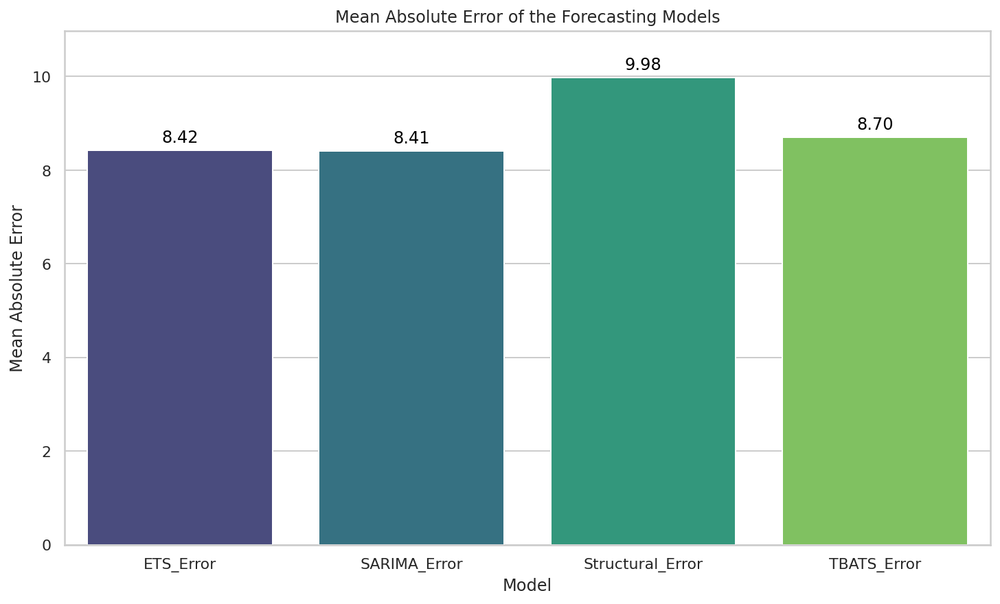

In [ ]:
# Set the aesthetic style
sns.set(style="whitegrid")

# Create a bar plot
plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(
    x='Model',
    y='Mean_Absolute_Error',
    hue='Model',
    data=mean_errors_df,
    palette='viridis',
    dodge=False,
    legend=False
)

# Add the error values on top of each bar
for index, row in mean_errors_df.iterrows():
    bar_plot.text(
        index,
        row['Mean_Absolute_Error'] + 0.1,
        f"{row['Mean_Absolute_Error']:.2f}",
        color='black',
        ha="center",
        va='bottom'
    )

plt.title("Mean Absolute Error of the Forecasting Models")
plt.ylabel("Mean Absolute Error")
plt.xlabel("Model")
plt.ylim(0, mean_errors_df['Mean_Absolute_Error'].max() * 1.1)
plt.show()